# Performance of CITE-seq antibodies

- In this notebook density plots are generated from CLR normalized protein counts of different NK cell markers. 
- For comparisons, signals of NK cell markers are compared between NK and B cells. Cells have been annotated by the authors of Neurips dataset. 

In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scvi
import scanpy as sc
import umap
from muon import prot as pt

from ridgeplot import ridgeplot

import warnings

warnings.filterwarnings('ignore')



In [48]:
plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=120, dpi_save=300, vector_friendly=True)

In [49]:
adata_neurips = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_neurips_norm_outer.h5ad')

In [50]:
#protein expression

prot=adata_neurips.obsm['protein_expression_clr_neurips']

In [51]:
prot

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,HLA-E,CD82,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15
GTAGTACCAATCCTTT-1-s4d1,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,0.694828,...,1.532575,0.614600,0.900688,1.389844,0.918109,0.0,0.0,0.0,0.0,0.0
CTCAAGAGTCACAGAG-1-s4d1,0.652674,1.069339,1.657770,0.890243,1.377072,1.264995,1.863027,1.101769,1.562259,1.072649,...,1.283465,0.614600,1.786480,0.762359,1.112478,0.0,0.0,0.0,0.0,0.0
CTGTGGGTCATGCGGC-1-s4d1,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,1.013739,...,1.344431,0.353792,0.860303,0.979461,1.147198,0.0,0.0,0.0,0.0,0.0
CGTGATAGTTATCTGG-1-s4d1,0.000000,1.249182,1.335424,1.256332,2.674106,1.322314,0.289336,1.240123,1.397398,1.525053,...,0.859205,1.527772,0.629556,0.854928,1.000442,0.0,0.0,0.0,0.0,0.0
AGATCCAAGATCGGTG-1-s4d1,2.784459,1.132949,1.674846,1.669058,1.663981,2.101246,2.112640,1.417276,1.884321,1.861734,...,1.429432,1.031029,2.808629,2.007436,2.064066,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GTGGTTAGTCGAGTTT-1-s1d3,0.000000,0.175083,0.734526,0.000000,0.505917,1.235054,1.241451,0.512721,0.502246,1.766372,...,0.374154,0.425643,0.519947,0.484666,0.497623,0.0,0.0,0.0,0.0,0.0
GCTACAACAGTGCGCT-1-s1d3,0.378666,0.453643,0.894450,0.000000,0.766577,1.058199,1.529611,0.512721,0.663922,1.766372,...,1.074485,0.100854,1.415230,0.854928,0.560915,0.0,0.0,0.0,0.0,0.0
AACAAAGGTTGGTACT-1-s1d3,0.378666,0.324031,1.094684,0.306698,0.401377,1.983838,2.156735,0.512721,0.835018,2.400949,...,1.149104,1.324148,1.315806,0.605141,0.357584,0.0,0.0,0.0,0.0,0.0
TGACAGTCATGGCTGC-1-s1d3,0.378666,0.764571,0.776968,0.306698,0.152401,1.358780,1.753042,0.201533,0.586348,1.543085,...,1.373575,0.276377,1.113769,0.660339,0.960123,0.0,0.0,0.0,0.0,0.0


In [52]:
#Select only NK cells

nk = adata_neurips[(adata_neurips.obs['cell_type'] == "NK") | (adata_neurips.obs['cell_type'] == "NK CD158e1+")]

In [53]:
#Select only B cells

b=adata[adata.obs['cell_type'] == 'Naive CD20+ B IGKC+' ]

In [54]:
b

View of AnnData object with n_obs × n_vars = 3835 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

In [55]:
nk

View of AnnData object with n_obs × n_vars = 7388 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

In [65]:
sample_nk = nk[nk.obs['POOL'] == 's4d1']

In [66]:
sample_b = b[b.obs['POOL'] == 's4d1']

In [67]:
sample_nk

View of AnnData object with n_obs × n_vars = 665 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

In [68]:
sample_b

View of AnnData object with n_obs × n_vars = 286 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

In [69]:
#protein counts of selected sample
nk_prot=sample_nk.obsm['protein_expression_clr_neurips']

In [70]:
#isotype control counts of selected sample (only NK cells)

isotype=sample_nk.obsm['ADT_isotype_controls']

In [71]:
isotype

,Mouse-IgG1,Mouse-IgG2a,Mouse-IgG2b,Rat-IgG2b,Rat-IgG1,Rat-IgG2a
GTAGTACCAATCCTTT-1-s4d1,0.371773,0.415173,0.371773,0.062345,0.176461,0.228980
CTGTGGGTCATGCGGC-1-s4d1,0.533398,0.162271,0.424311,0.301850,0.000000,0.424311
GCAACATTCGCAAGAG-1-s4d1,0.677794,0.592188,0.448242,0.077696,0.217030,0.077696
TCACGGGTCGCACGAC-1-s4d1,0.521819,0.186917,0.480314,0.186917,0.242190,0.480314
CGCCAGAAGACCATTC-1-s4d1,0.763261,0.386335,0.431098,0.386335,0.339475,0.126401
...,...,...,...,...,...,...
CCGGACAAGGCCCACT-1-s4d1,0.874242,0.686202,0.505273,0.152171,0.284215,0.505273
CGTGATACACGACCTG-1-s4d1,0.501835,0.501835,0.397979,0.341704,0.549980,0.218659
GTTCTATCACGTCGGT-1-s4d1,0.682811,0.361377,0.626263,0.196924,0.103302,0.103302
TAGATCGTCTCTATAC-1-s4d1,0.306659,0.407083,0.541018,0.252393,0.306659,0.195013


In [72]:
#protein counts of selected sample (sample with only B cells)
b_prot=sample_b.obsm['protein_expression_clr_neurips']

# Comparisons

In [73]:
#Proteins to visualize

column_names = ['CD52',
 'CD127',
 'CD226',
 'CD335',
 'CD195',
 'CD56',
 'CD5',
 'CD69',
 'CD94',
 'CD16',
 'CD122',
 'CD57',
 'CD38',
 'CD158e1',
 'TIGIT',
 'CD314',
 'CD7',
 'CD62L',
 'CD2',
 'CD27',
 'CX3CR1',
 'CD161',
 'CD155',
 'CD158b']

df = nk_prot[column_names]

fig = ridgeplot(
    samples=df.values.T,
    bandwidth=0.5,
    kde_points=np.linspace(-3, 10, 400),
    colorscale="Blues",
    colormode="index",
    coloralpha=0.5,
    labels=column_names,
    spacing=5 / 8,
)

fig.update_layout(
    #title="Neurips, X sample, NK cells",
    height=600,
    width=600,
    plot_bgcolor="rgba(255, 255, 255, 0.0)",
    xaxis_gridcolor="rgba(0, 0, 0, 0.1)",
    yaxis_gridcolor="rgba(0, 0, 0, 0.1)",
    yaxis_title="CLR normalized protein counts",
)
fig.show()

df1 = b_prot[column_names]

fig = ridgeplot(
    samples=df1.values.T,
    bandwidth=0.5,
    kde_points=np.linspace(-3, 10, 400),
    colorscale="Blues",
    colormode="index",
    coloralpha=0.5,
    labels=column_names,
    spacing=5 / 8,
)

fig.update_layout(
    #title="Neurips, X sample, B cells",
    height=600,
    width=600,
    plot_bgcolor="rgba(255, 255, 255, 0.0)",
    xaxis_gridcolor="rgba(0, 0, 0, 0.1)",
    yaxis_gridcolor="rgba(0, 0, 0, 0.1)",
    yaxis_title="CLR normalized protein counts",
)
fig.show()


In [74]:
#Combine df of NK cell marker counts + isotype controls

df_comb=pd.concat([nk_prot, isotype], axis = 1)
df_comb.shape

(665, 145)

Text(0, 0.5, ' ')

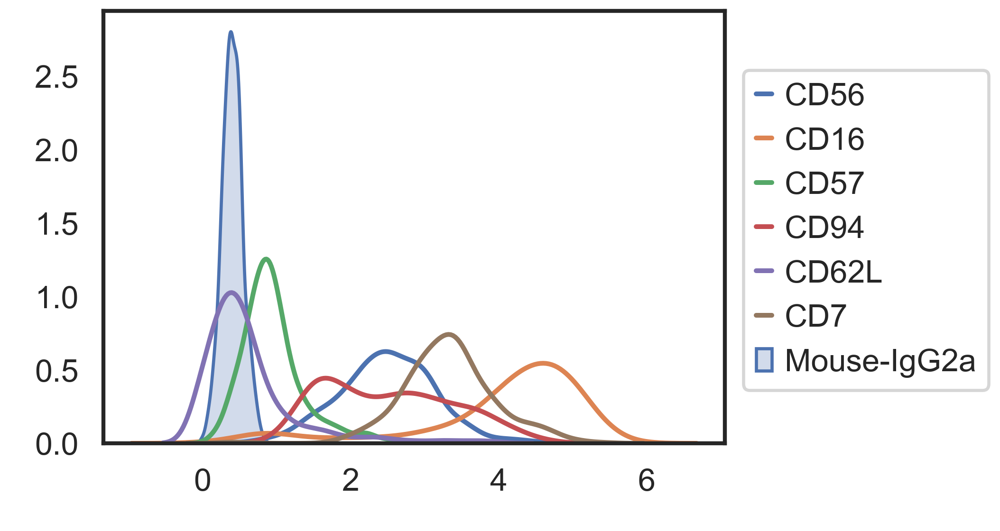

In [75]:
sns.set(style='white', font_scale = 0.5, context='poster', rc={'figure.figsize':(7,5)})


# List of markers to plot
markers = ['CD56', 'CD16', 'CD57', 'CD94', 'CD62L', 'CD7']
marker_isotype = ['Mouse-IgG2a']

# Iterate through markers
for marker in markers:
    a= sns.kdeplot(df_comb[marker],
                #fill=True,
                label = marker)
sns.kdeplot(df_comb[marker_isotype],
                fill=True,
                label = "Mouse-IgG2a")
    
a.tick_params(axis='y', labelsize=20)
a.tick_params(axis='x', labelsize=20)
    
# Plot formatting
plt.legend(prop={'size': 20}, loc='upper right', bbox_to_anchor=(1.45, 0.9))
#plt.title('s3d6')
plt.xlabel(' ')
plt.ylabel(' ')

In [76]:
#Density plot, all markers

column_names = nk_prot.columns

df = nk_prot[column_names]

fig = ridgeplot(
    samples=df.values.T,
    bandwidth=0.2,
    kde_points=np.linspace(-5, 10, 400),
    colorscale="Blues",
    colormode="index",
    coloralpha=0.6,
    labels=column_names,
    spacing=3 / 10,
)

fig.update_layout(
    #title="Neurips, s4d1 sample",
    height = 2500,
    width=900,
    plot_bgcolor="rgba(255, 255, 255, 0.0)",
    xaxis_gridcolor="rgba(0, 0, 0, 0.1)",
    yaxis_gridcolor="rgba(0, 0, 0, 0.1)",
    yaxis_title="CLR normalized protein counts",
)
fig.show()